# pycisTopic analysis

Full dataset, using consensus peak regions.

In [10]:
import pycisTopic

%load_ext nb_black
import warnings

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
import pickle
import pandas as pd
import os

%load_ext lab_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black
The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


<IPython.core.display.Javascript object>

In [11]:
!pwd

/lustre1/project/stg_00090/scatac_benchmark/fixedcells_downsample_series


<IPython.core.display.Javascript object>

In [12]:
wdir = "/lustre1/project/stg_00090/scatac_benchmark/fixedcells_downsample_series"
os.chdir(wdir)

<IPython.core.display.Javascript object>

In [13]:
# create output directory:
f_final_dir = os.path.join(wdir, "downstream_analysis")
if not os.path.exists(f_final_dir):
    os.makedirs(f_final_dir)

<IPython.core.display.Javascript object>

In [14]:
import glob

<IPython.core.display.Javascript object>

## Save/load cisTopic objects

In [15]:
cto_consensus_paths = sorted(glob.glob(f"*k/cistopic_objects/*topics.pkl"))
cistopic_obj_path_dict = {
    x.split("/")[-1].split("__cto")[0]: x for x in cto_consensus_paths
}
cistopic_obj_path_dict

{'BIO_ddseq_1.10k': '10k/cistopic_objects/BIO_ddseq_1.10k__cto.model_11topics.pkl',
 'BIO_ddseq_2.10k': '10k/cistopic_objects/BIO_ddseq_2.10k__cto.model_18topics.pkl',
 'BIO_ddseq_3.10k': '10k/cistopic_objects/BIO_ddseq_3.10k__cto.model_11topics.pkl',
 'BIO_ddseq_4.10k': '10k/cistopic_objects/BIO_ddseq_4.10k__cto.model_9topics.pkl',
 'BRO_mtscatac_1.10k': '10k/cistopic_objects/BRO_mtscatac_1.10k__cto.model_11topics.pkl',
 'BRO_mtscatac_2.10k': '10k/cistopic_objects/BRO_mtscatac_2.10k__cto.model_12topics.pkl',
 'CNA_10xmultiome_1.10k': '10k/cistopic_objects/CNA_10xmultiome_1.10k__cto.model_9topics.pkl',
 'CNA_10xmultiome_2.10k': '10k/cistopic_objects/CNA_10xmultiome_2.10k__cto.model_15topics.pkl',
 'CNA_10xv11_1.10k': '10k/cistopic_objects/CNA_10xv11_1.10k__cto.model_10topics.pkl',
 'CNA_10xv11_2.10k': '10k/cistopic_objects/CNA_10xv11_2.10k__cto.model_17topics.pkl',
 'CNA_10xv11_3.10k': '10k/cistopic_objects/CNA_10xv11_3.10k__cto.model_11topics.pkl',
 'CNA_10xv11_4.10k': '10k/cistopic_o

<IPython.core.display.Javascript object>

In [16]:
seurat_path_dict = {
    x.split("/")[-1].split("__")[0]: x
    for x in sorted(glob.glob(f"*k/cell_type_classification/*.txt"))
}
seurat_path_dict

{'BIO_ddseq_1.10k': '10k/cell_type_classification/BIO_ddseq_1.10k__cell_type_seurat.txt',
 'BIO_ddseq_2.10k': '10k/cell_type_classification/BIO_ddseq_2.10k__cell_type_seurat.txt',
 'BIO_ddseq_3.10k': '10k/cell_type_classification/BIO_ddseq_3.10k__cell_type_seurat.txt',
 'BIO_ddseq_4.10k': '10k/cell_type_classification/BIO_ddseq_4.10k__cell_type_seurat.txt',
 'BRO_mtscatac_1.10k': '10k/cell_type_classification/BRO_mtscatac_1.10k__cell_type_seurat.txt',
 'BRO_mtscatac_2.10k': '10k/cell_type_classification/BRO_mtscatac_2.10k__cell_type_seurat.txt',
 'CNA_10xmultiome_1.10k': '10k/cell_type_classification/CNA_10xmultiome_1.10k__cell_type_seurat.txt',
 'CNA_10xmultiome_2.10k': '10k/cell_type_classification/CNA_10xmultiome_2.10k__cell_type_seurat.txt',
 'CNA_10xv11_1.10k': '10k/cell_type_classification/CNA_10xv11_1.10k__cell_type_seurat.txt',
 'CNA_10xv11_2.10k': '10k/cell_type_classification/CNA_10xv11_2.10k__cell_type_seurat.txt',
 'CNA_10xv11_3.10k': '10k/cell_type_classification/CNA_10xv1

<IPython.core.display.Javascript object>

 ## Topic binarization & QC

In [17]:
from pycisTopic.topic_binarization import binarize_topics
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc
from pycisTopic.utils import fig2img
import matplotlib.pyplot as plt
from pycisTopic.topic_qc import topic_annotation
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features,
)
from pycisTopic.clust_vis import plot_imputed_features
import numpy as np
import copy

<IPython.core.display.Javascript object>

### Binarize the topic-region distributions

downstream_analysis/DARs/BIO_ddseq_1.10k already exists!
downstream_analysis/DARs/BIO_ddseq_2.10k already exists!
downstream_analysis/DARs/BIO_ddseq_3.10k already exists!
downstream_analysis/DARs/BIO_ddseq_4.10k already exists!
downstream_analysis/DARs/BRO_mtscatac_1.10k already exists!
downstream_analysis/DARs/BRO_mtscatac_2.10k already exists!
downstream_analysis/DARs/CNA_10xmultiome_1.10k already exists!
downstream_analysis/DARs/CNA_10xmultiome_2.10k already exists!
downstream_analysis/DARs/CNA_10xv11_1.10k already exists!
downstream_analysis/DARs/CNA_10xv11_2.10k already exists!
downstream_analysis/DARs/CNA_10xv11_3.10k already exists!
downstream_analysis/DARs/CNA_10xv11_4.10k already exists!
downstream_analysis/DARs/CNA_10xv11_5.10k already exists!
downstream_analysis/DARs/CNA_10xv2_1.10k already exists!
downstream_analysis/DARs/CNA_10xv2_2.10k already exists!
downstream_analysis/DARs/CNA_hydrop_1.10k already exists!
downstream_analysis/DARs/CNA_hydrop_2.10k already exists!
downst

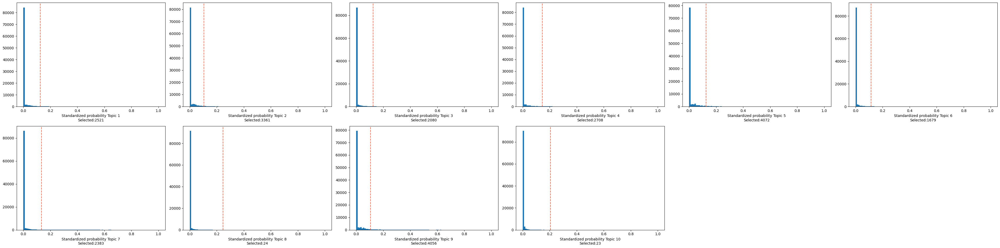

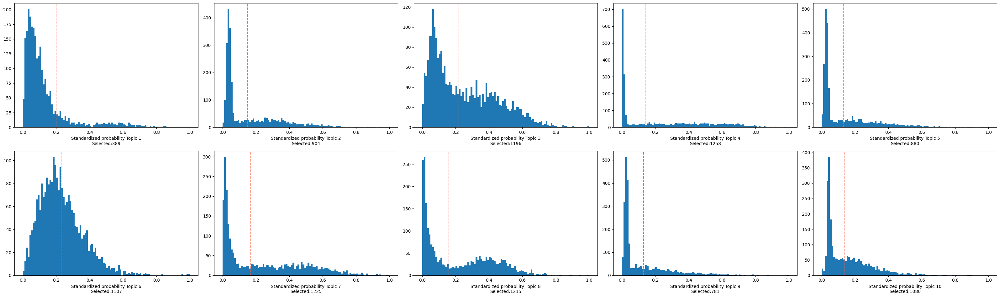

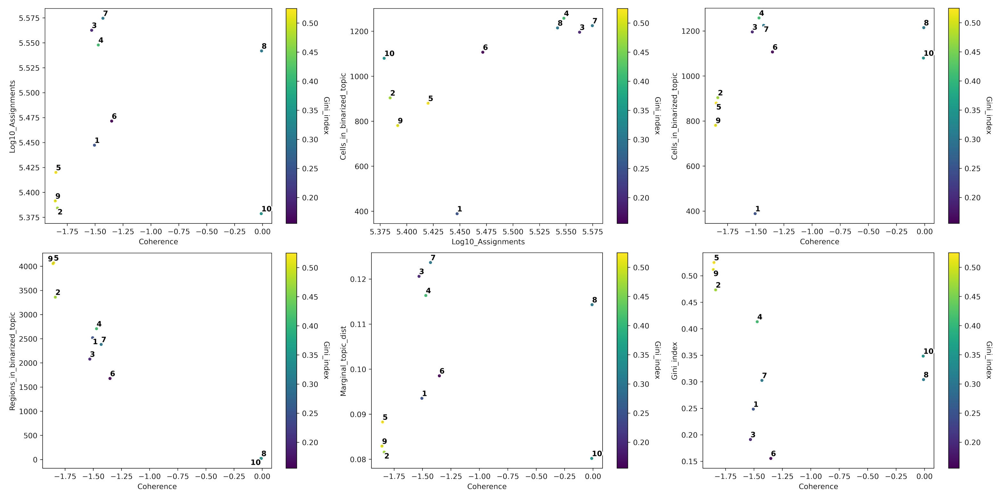

2023-02-02 14:19:25,961 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:19:26,499 cisTopic     INFO     Scaling
2023-02-02 14:19:26,989 cisTopic     INFO     Keep non zero rows
2023-02-02 14:19:27,568 cisTopic     INFO     Imputed accessibility sparsity: 0.22375898977689024
2023-02-02 14:19:27,570 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:19:27,571 cisTopic     INFO     Done!
2023-02-02 14:19:27,572 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:19:29,625 cisTopic     INFO     Done!
2023-02-02 14:19:32,075 cisTopic     INFO     Calculating mean
2023-02-02 14:19:32,318 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

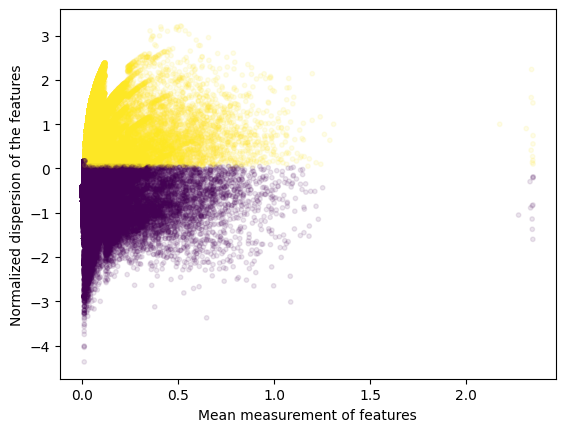

2023-02-02 14:19:37,575 cisTopic     INFO     Done!
Found 42759 variable regions


2023-02-02 14:19:44,493	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1106542) 2023-02-02 14:19:47,690 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1106541) 2023-02-02 14:19:47,825 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1106538) 2023-02-02 14:19:47,925 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1106535) 2023-02-02 14:19:48,060 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1106543) 2023-02-02 14:19:48,256 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1106533) 2023-02-02 14:19:48,415 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1106530) 2023-02-02 14:19:48,623 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1106542) 2023-02-02 14:19:48,963 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1106541) 2023-02-02 14:19:49,105 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1106538) 2023-02-02 14:19:49

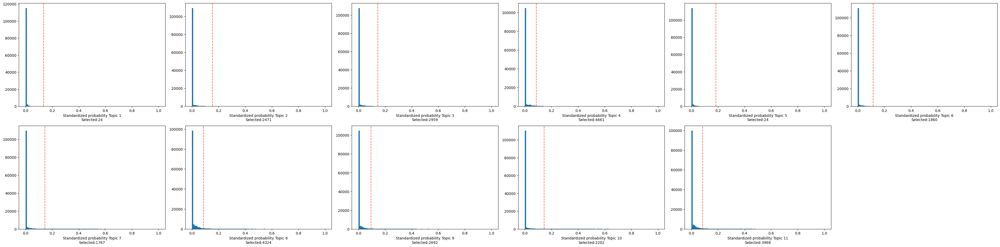

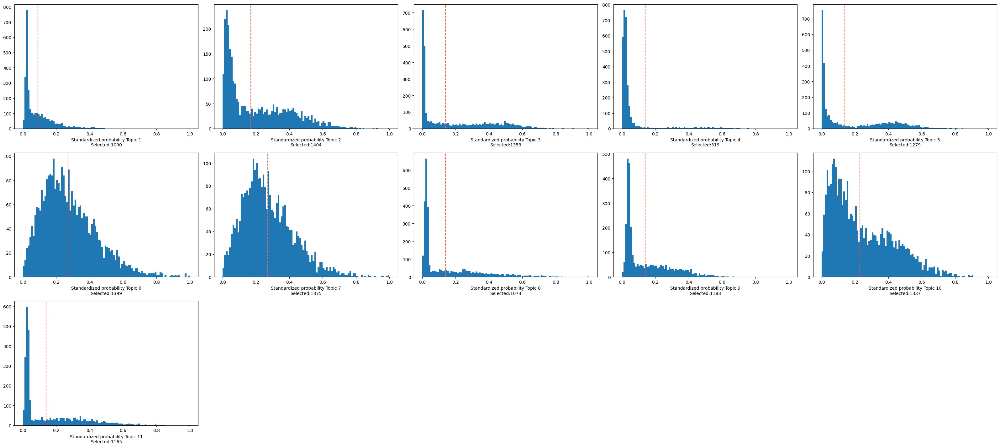

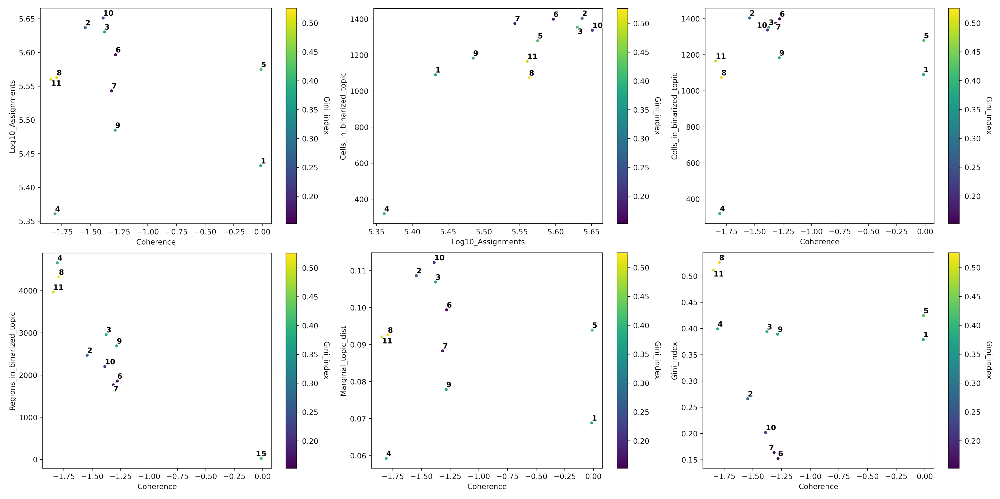

2023-02-02 14:20:49,719 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:20:50,237 cisTopic     INFO     Scaling
2023-02-02 14:20:50,962 cisTopic     INFO     Keep non zero rows
2023-02-02 14:20:51,783 cisTopic     INFO     Imputed accessibility sparsity: 0.2739274894456256
2023-02-02 14:20:51,785 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:20:51,786 cisTopic     INFO     Done!
2023-02-02 14:20:51,789 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:20:54,737 cisTopic     INFO     Done!
2023-02-02 14:20:57,726 cisTopic     INFO     Calculating mean
2023-02-02 14:20:58,076 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

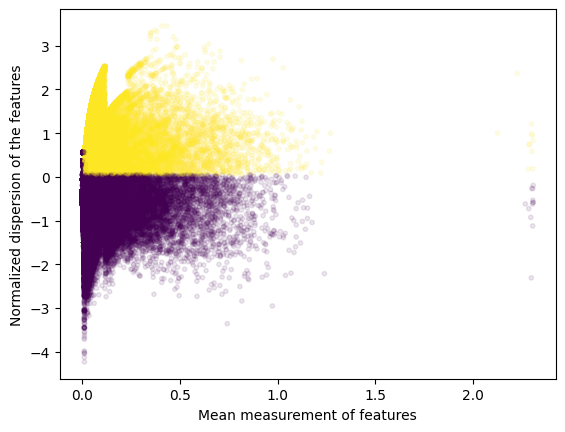

2023-02-02 14:21:04,363 cisTopic     INFO     Done!
Found 48774 variable regions


2023-02-02 14:21:08,538	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1107397) 2023-02-02 14:21:11,644 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1107396) 2023-02-02 14:21:11,834 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1107387) 2023-02-02 14:21:12,110 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1107398) 2023-02-02 14:21:12,330 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1107391) 2023-02-02 14:21:12,576 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1107389) 2023-02-02 14:21:12,795 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1107393) 2023-02-02 14:21:13,035 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1107397) 2023-02-02 14:21:13,494 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1107396) 2023-02-02 14:21:13,671 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1107387) 2023-02-02 14:21:13

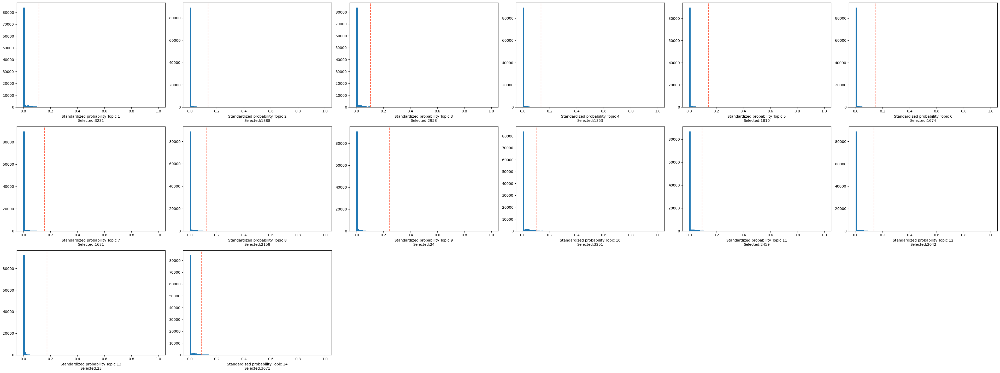

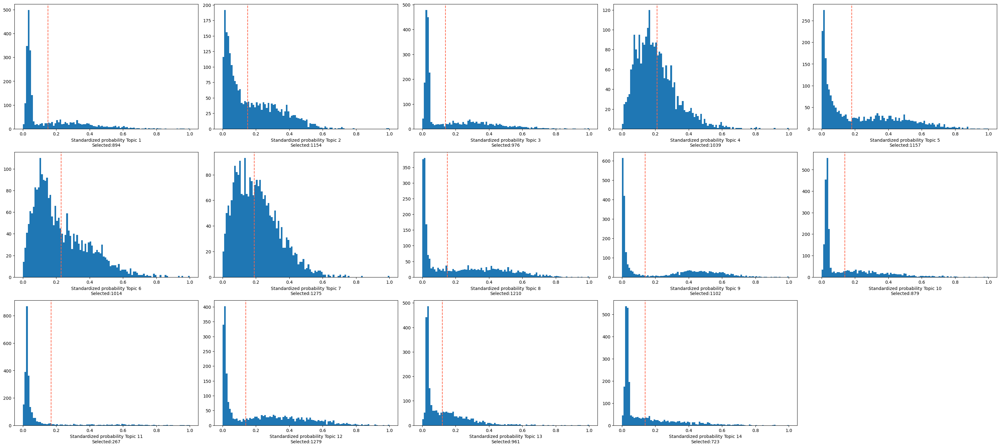

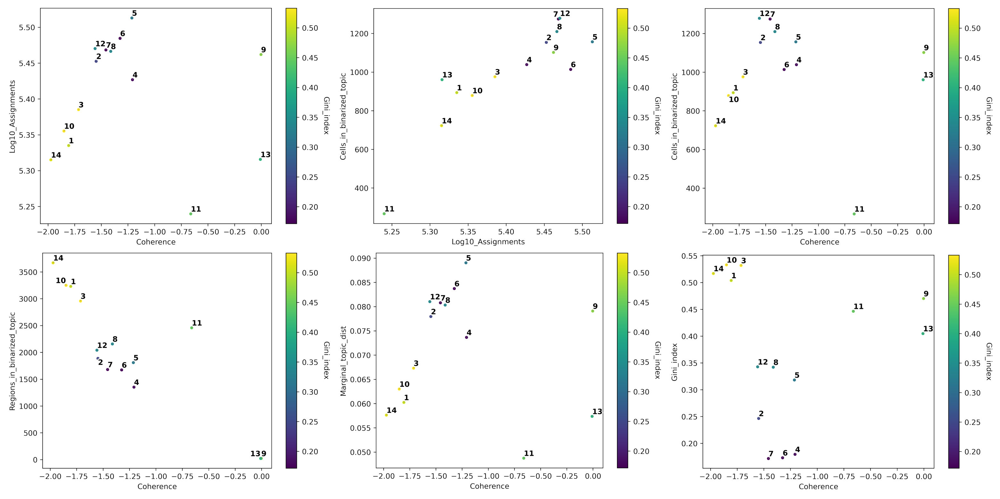

2023-02-02 14:22:24,045 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:22:24,518 cisTopic     INFO     Scaling
2023-02-02 14:22:24,990 cisTopic     INFO     Keep non zero rows
2023-02-02 14:22:25,561 cisTopic     INFO     Imputed accessibility sparsity: 0.23733530002823078
2023-02-02 14:22:25,562 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:22:25,563 cisTopic     INFO     Done!
2023-02-02 14:22:25,567 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:22:27,595 cisTopic     INFO     Done!
2023-02-02 14:22:29,715 cisTopic     INFO     Calculating mean
2023-02-02 14:22:29,957 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

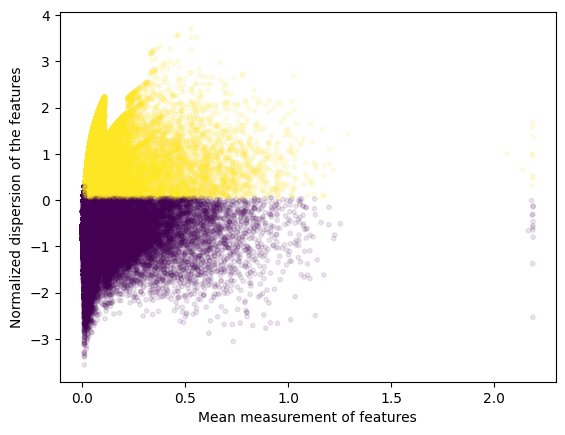

2023-02-02 14:22:35,148 cisTopic     INFO     Done!
Found 45204 variable regions


2023-02-02 14:22:40,343	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1108425) 2023-02-02 14:22:43,518 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1108418) 2023-02-02 14:22:43,618 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1108424) 2023-02-02 14:22:43,819 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1108421) 2023-02-02 14:22:43,951 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1108416) 2023-02-02 14:22:44,129 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1108419) 2023-02-02 14:22:44,322 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1108420) 2023-02-02 14:22:44,478 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1108425) 2023-02-02 14:22:44,868 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1108418) 2023-02-02 14:22:44,979 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1108424) 2023-02-02 14:22:45

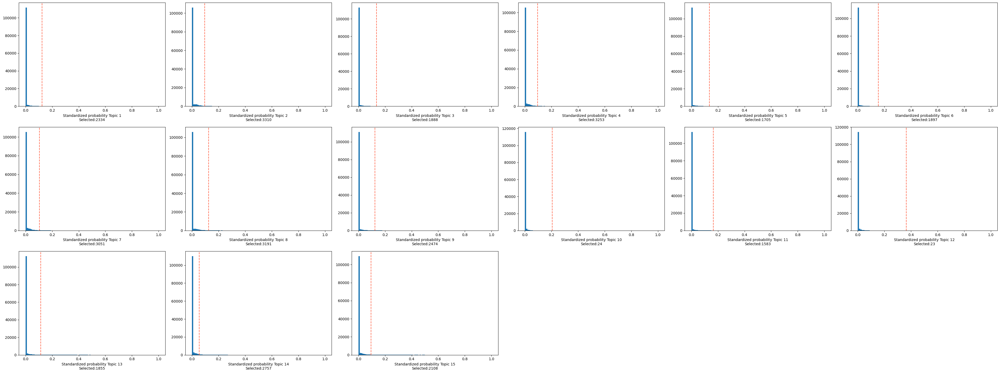

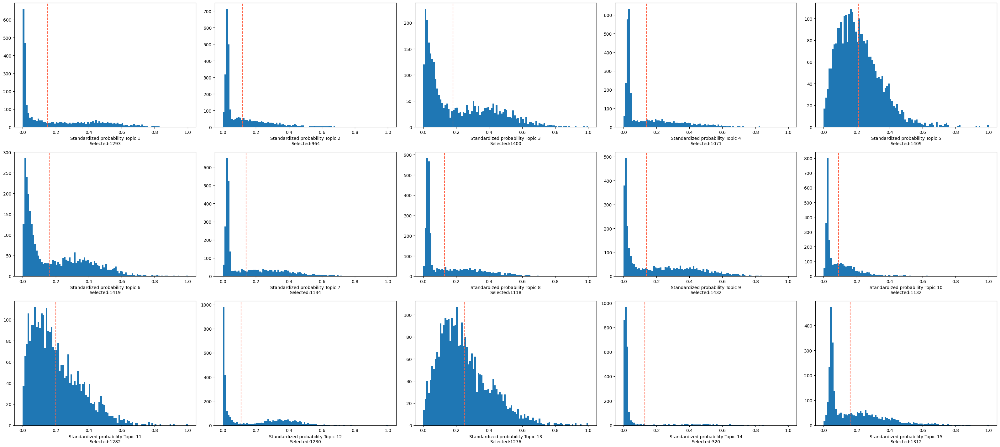

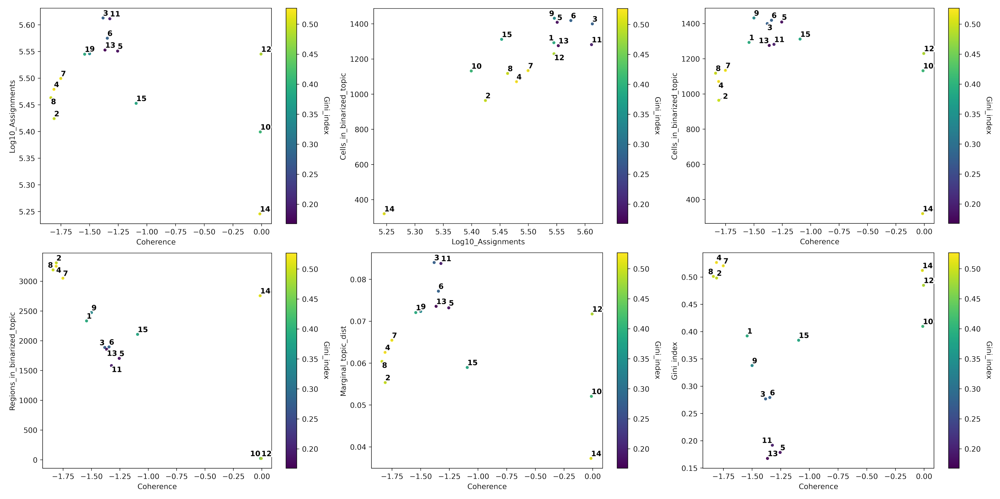

2023-02-02 14:23:51,834 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:23:52,546 cisTopic     INFO     Scaling
2023-02-02 14:23:53,286 cisTopic     INFO     Keep non zero rows
2023-02-02 14:23:54,129 cisTopic     INFO     Imputed accessibility sparsity: 0.28709545868887576
2023-02-02 14:23:54,130 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:23:54,132 cisTopic     INFO     Done!
2023-02-02 14:23:54,135 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:23:57,172 cisTopic     INFO     Done!
2023-02-02 14:24:00,392 cisTopic     INFO     Calculating mean
2023-02-02 14:24:00,753 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

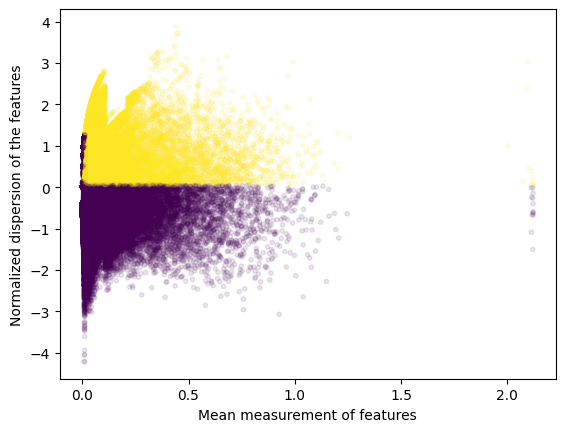

2023-02-02 14:24:07,195 cisTopic     INFO     Done!
Found 49381 variable regions


2023-02-02 14:24:11,347	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1109341) 2023-02-02 14:24:14,485 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1109330) 2023-02-02 14:24:14,800 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1109339) 2023-02-02 14:24:14,930 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1109327) 2023-02-02 14:24:15,157 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1109337) 2023-02-02 14:24:15,401 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1109328) 2023-02-02 14:24:15,680 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1109332) 2023-02-02 14:24:15,834 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1109341) 2023-02-02 14:24:16,340 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1109330) 2023-02-02 14:24:16,623 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1109339) 2023-02-02 14:24:16

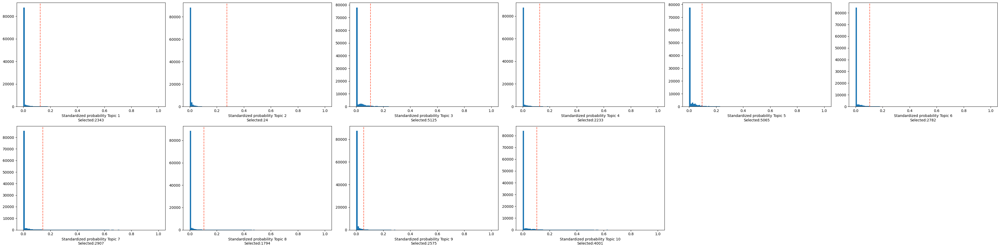

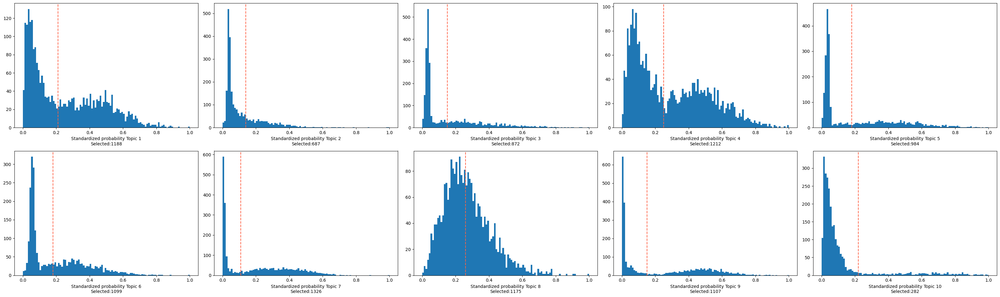

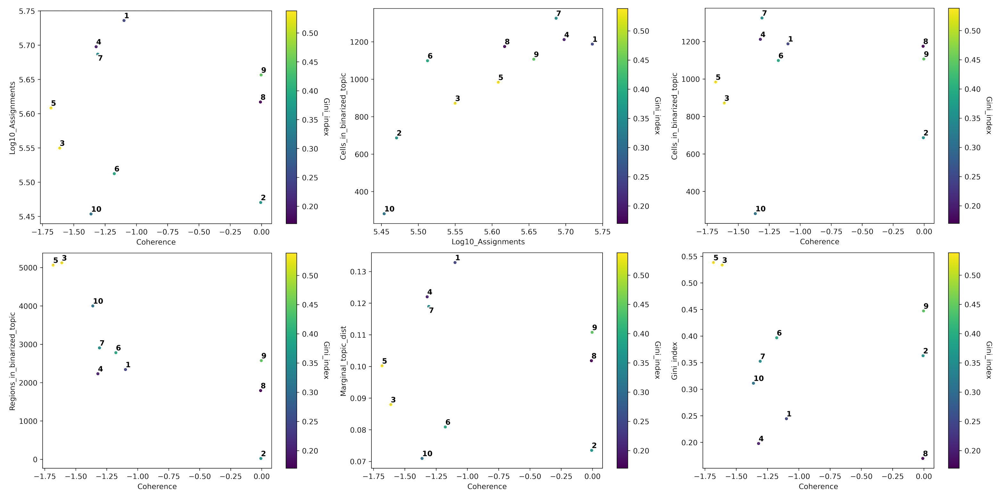

2023-02-02 14:25:24,015 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:25:24,384 cisTopic     INFO     Scaling
2023-02-02 14:25:24,878 cisTopic     INFO     Keep non zero rows
2023-02-02 14:25:25,453 cisTopic     INFO     Imputed accessibility sparsity: 0.22662215768584892
2023-02-02 14:25:25,454 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:25:25,455 cisTopic     INFO     Done!
2023-02-02 14:25:25,459 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:25:27,491 cisTopic     INFO     Done!
2023-02-02 14:25:29,618 cisTopic     INFO     Calculating mean
2023-02-02 14:25:29,862 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

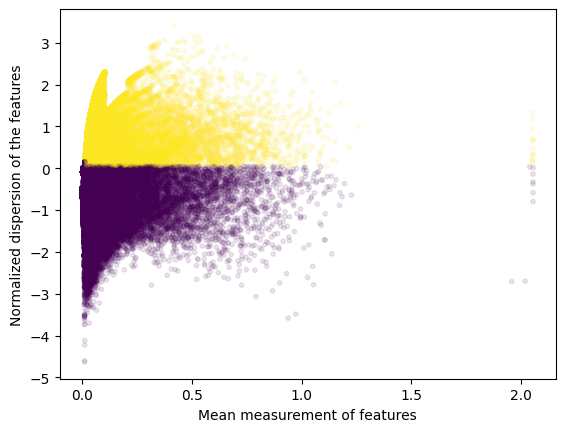

2023-02-02 14:25:35,206 cisTopic     INFO     Done!
Found 43743 variable regions


2023-02-02 14:25:39,273	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1110227) 2023-02-02 14:25:42,482 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1110226) 2023-02-02 14:25:42,414 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1110219) 2023-02-02 14:25:42,631 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1110225) 2023-02-02 14:25:42,894 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1110223) 2023-02-02 14:25:42,960 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1110228) 2023-02-02 14:25:43,356 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1110221) 2023-02-02 14:25:43,266 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1110227) 2023-02-02 14:25:43,760 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1110226) 2023-02-02 14:25:43,724 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1110219) 2023-02-02 14:25:43

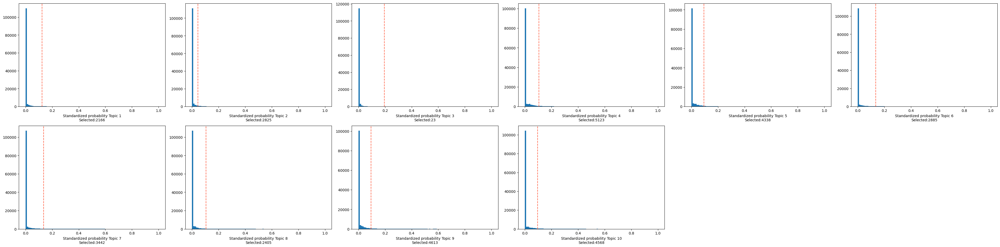

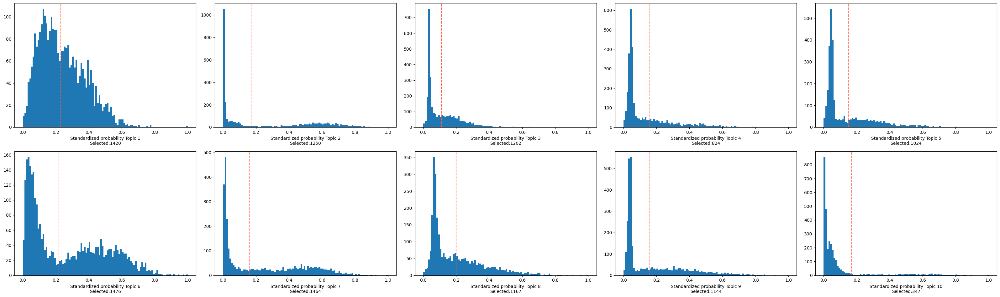

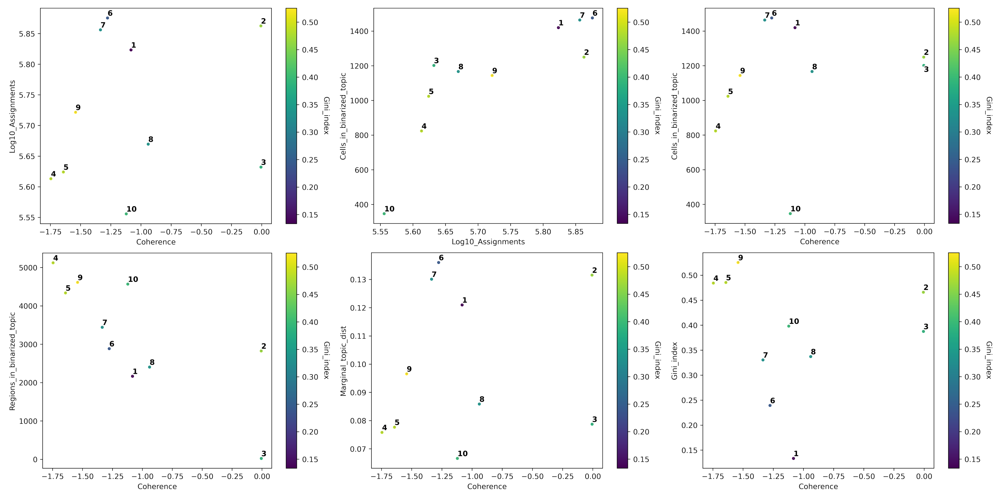

2023-02-02 14:26:42,622 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:26:43,240 cisTopic     INFO     Scaling
2023-02-02 14:26:43,985 cisTopic     INFO     Keep non zero rows
2023-02-02 14:26:44,824 cisTopic     INFO     Imputed accessibility sparsity: 0.2738460731087835
2023-02-02 14:26:44,825 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:26:44,826 cisTopic     INFO     Done!
2023-02-02 14:26:44,829 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:26:47,845 cisTopic     INFO     Done!
2023-02-02 14:26:50,965 cisTopic     INFO     Calculating mean
2023-02-02 14:26:51,319 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

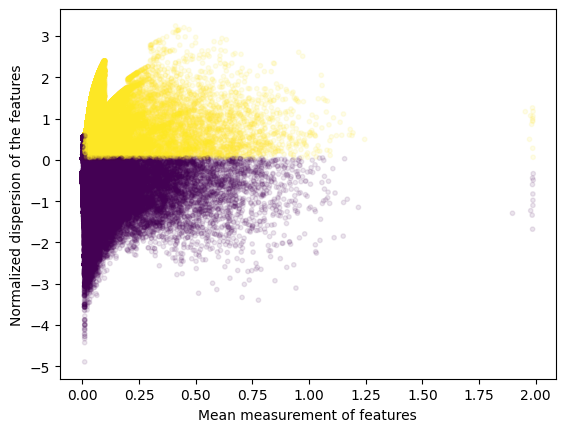

2023-02-02 14:26:57,921 cisTopic     INFO     Done!
Found 51062 variable regions


2023-02-02 14:27:02,065	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1111157) 2023-02-02 14:27:05,273 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1111149) 2023-02-02 14:27:05,553 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1111147) 2023-02-02 14:27:05,821 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1111155) 2023-02-02 14:27:06,028 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1111153) 2023-02-02 14:27:06,291 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1111150) 2023-02-02 14:27:06,543 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1111146) 2023-02-02 14:27:06,749 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1111157) 2023-02-02 14:27:07,159 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1111149) 2023-02-02 14:27:07,440 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1111147) 2023-02-02 14:27:07

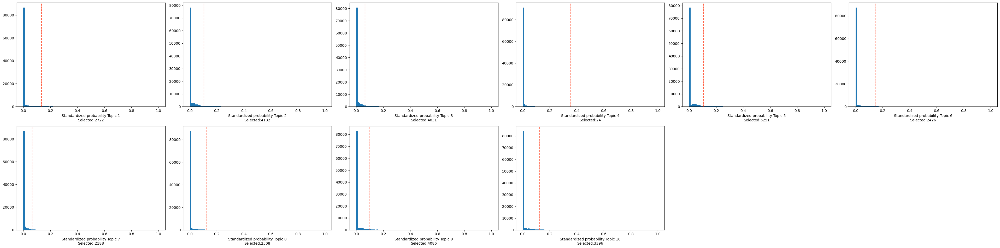

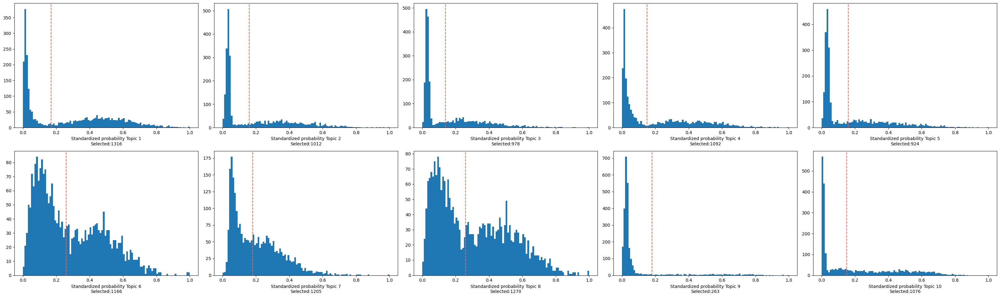

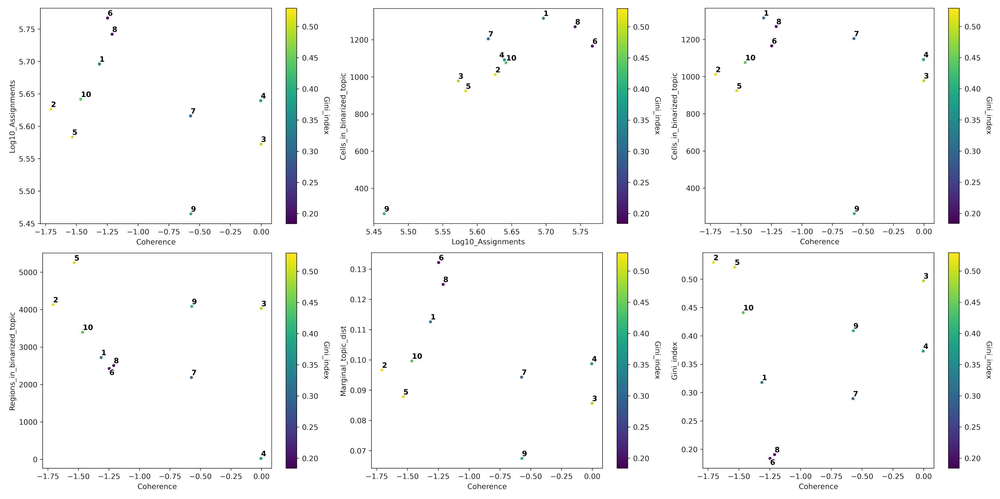

2023-02-02 14:28:15,324 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:28:15,731 cisTopic     INFO     Scaling
2023-02-02 14:28:16,217 cisTopic     INFO     Keep non zero rows
2023-02-02 14:28:16,789 cisTopic     INFO     Imputed accessibility sparsity: 0.23646548932753897
2023-02-02 14:28:16,790 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:28:16,791 cisTopic     INFO     Done!
2023-02-02 14:28:16,795 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:28:18,821 cisTopic     INFO     Done!
2023-02-02 14:28:20,879 cisTopic     INFO     Calculating mean
2023-02-02 14:28:21,121 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

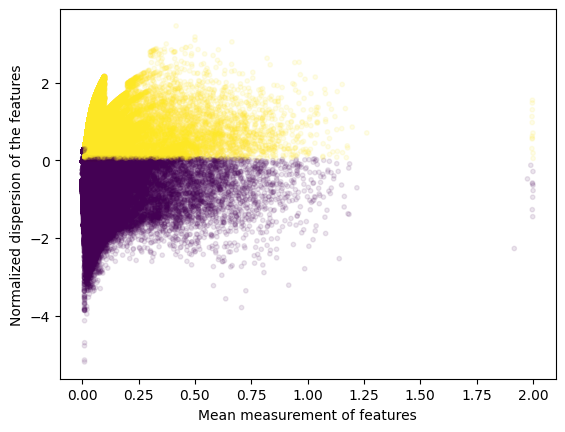

2023-02-02 14:28:26,146 cisTopic     INFO     Done!
Found 46823 variable regions


2023-02-02 14:28:30,079	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1112084) 2023-02-02 14:28:33,297 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1112094) 2023-02-02 14:28:33,460 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1112088) 2023-02-02 14:28:33,613 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1112089) 2023-02-02 14:28:33,827 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1112083) 2023-02-02 14:28:33,957 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1112090) 2023-02-02 14:28:34,184 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1112096) 2023-02-02 14:28:34,297 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1112084) 2023-02-02 14:28:34,661 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1112094) 2023-02-02 14:28:34,854 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1112088) 2023-02-02 14:28:35

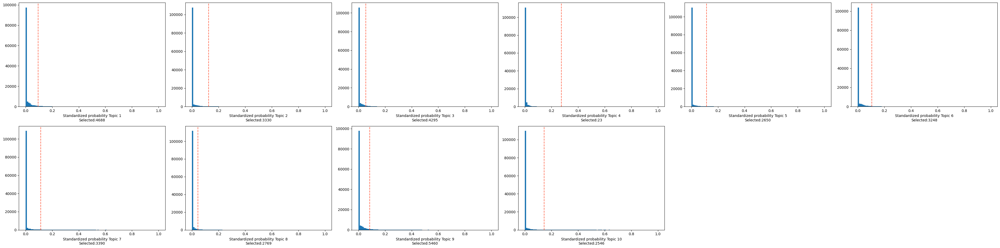

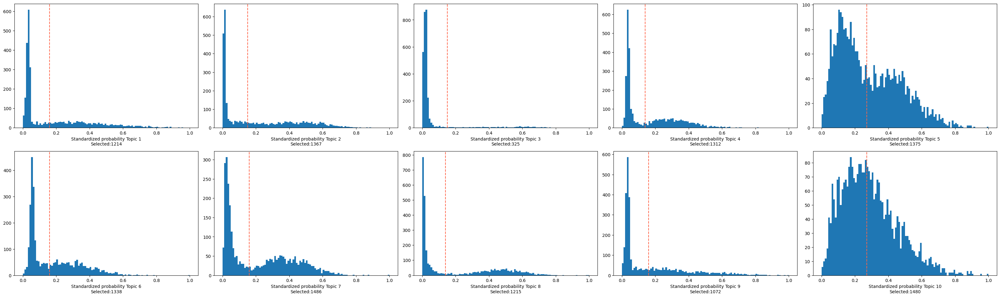

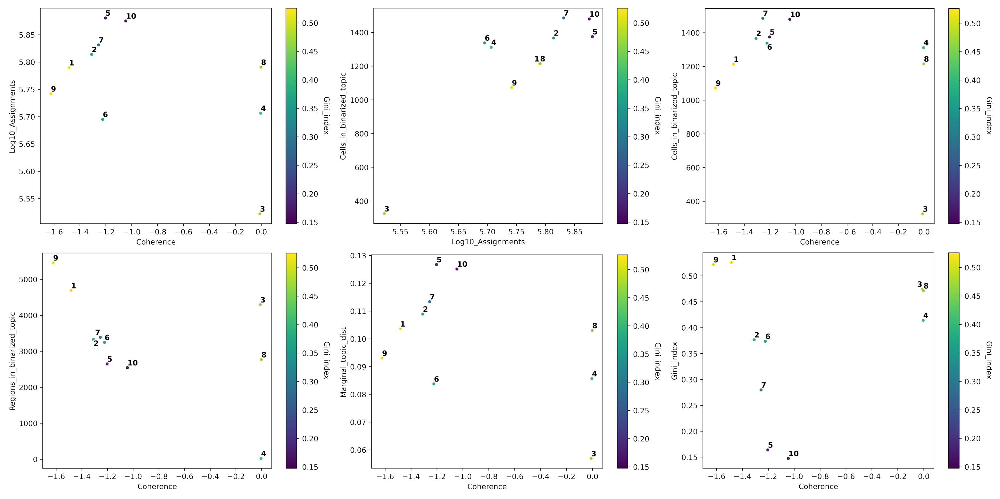

2023-02-02 14:29:37,661 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:29:38,204 cisTopic     INFO     Scaling
2023-02-02 14:29:38,957 cisTopic     INFO     Keep non zero rows
2023-02-02 14:29:39,814 cisTopic     INFO     Imputed accessibility sparsity: 0.2828861381945291
2023-02-02 14:29:39,816 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:29:39,817 cisTopic     INFO     Done!
2023-02-02 14:29:39,820 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:29:42,906 cisTopic     INFO     Done!
2023-02-02 14:29:45,565 cisTopic     INFO     Calculating mean
2023-02-02 14:29:45,926 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

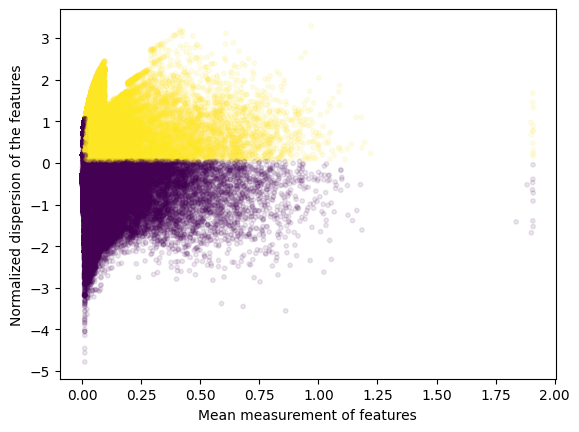

2023-02-02 14:29:52,514 cisTopic     INFO     Done!
Found 50511 variable regions


2023-02-02 14:29:56,667	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1113001) 2023-02-02 14:29:59,873 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1113009) 2023-02-02 14:30:00,119 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1113002) 2023-02-02 14:30:00,364 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1113016) 2023-02-02 14:30:00,548 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1112999) 2023-02-02 14:30:00,869 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1113003) 2023-02-02 14:30:01,098 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1113014) 2023-02-02 14:30:01,277 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1113001) 2023-02-02 14:30:01,745 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1113009) 2023-02-02 14:30:02,061 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1113002) 2023-02-02 14:30:02

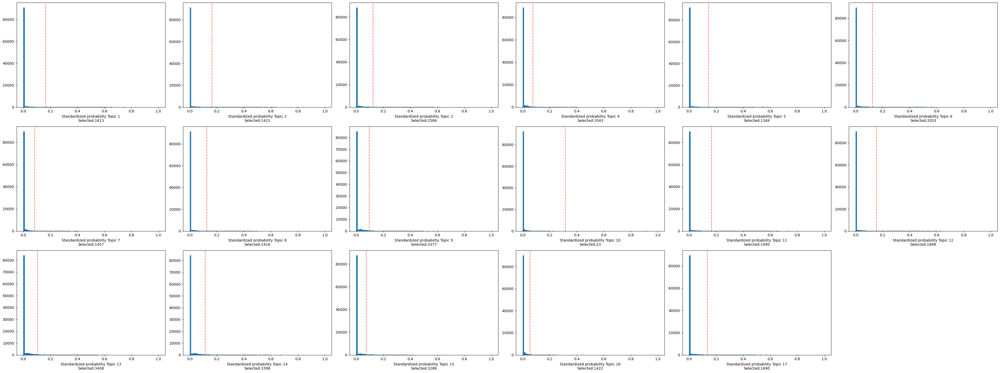

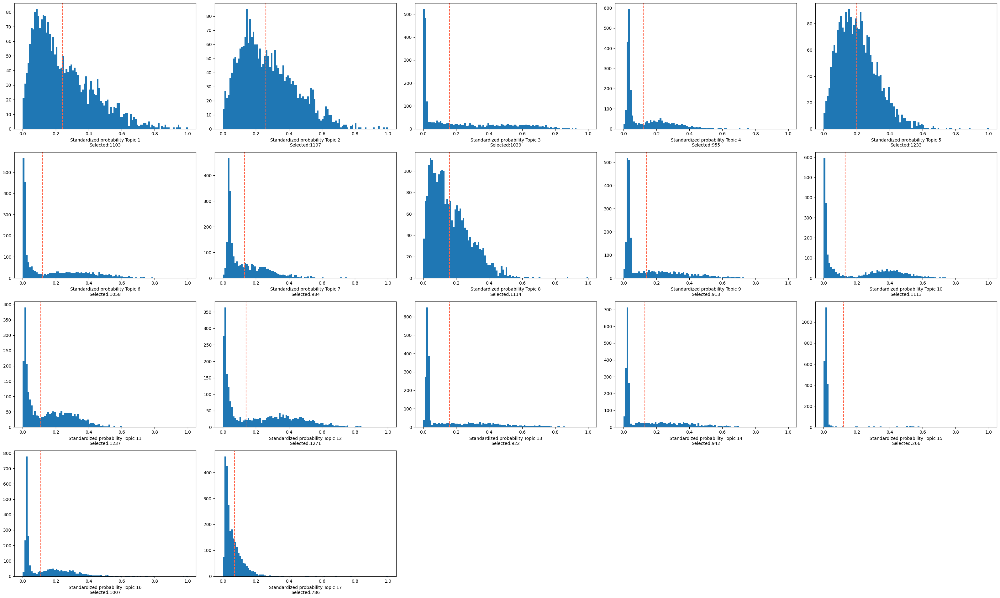

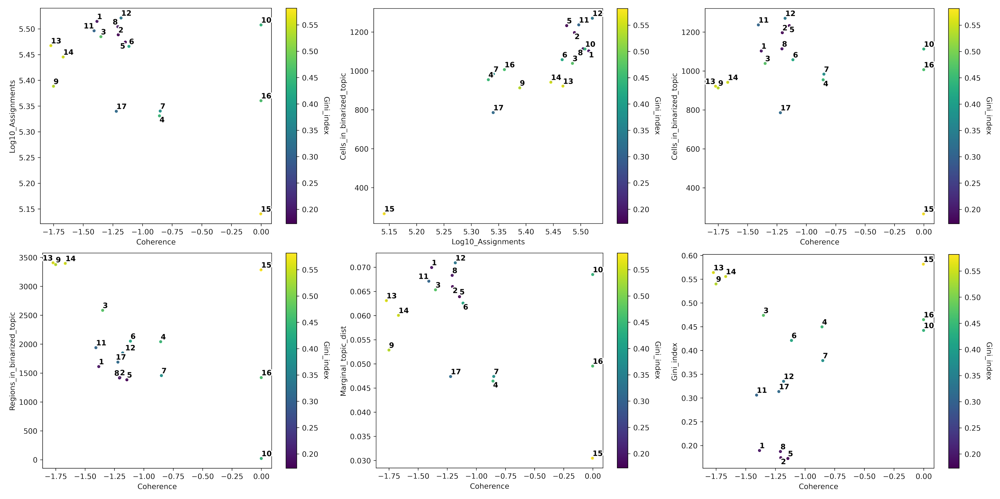

2023-02-02 14:31:24,987 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:31:25,402 cisTopic     INFO     Scaling
2023-02-02 14:31:25,901 cisTopic     INFO     Keep non zero rows
2023-02-02 14:31:26,485 cisTopic     INFO     Imputed accessibility sparsity: 0.24908389597736824
2023-02-02 14:31:26,486 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:31:26,487 cisTopic     INFO     Done!
2023-02-02 14:31:26,491 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:31:28,557 cisTopic     INFO     Done!
2023-02-02 14:31:30,394 cisTopic     INFO     Calculating mean
2023-02-02 14:31:30,644 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

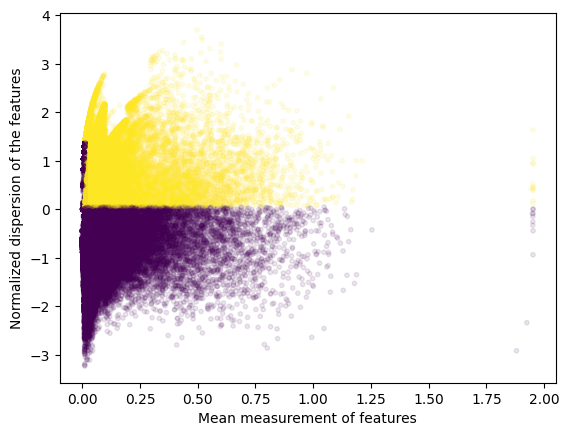

2023-02-02 14:31:37,719 cisTopic     INFO     Done!
Found 44751 variable regions


2023-02-02 14:31:43,288	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1113923) 2023-02-02 14:31:46,438 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1113927) 2023-02-02 14:31:46,530 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1113915) 2023-02-02 14:31:46,777 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1113913) 2023-02-02 14:31:46,953 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1113919) 2023-02-02 14:31:47,093 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1113920) 2023-02-02 14:31:47,292 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1113918) 2023-02-02 14:31:47,438 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1113923) 2023-02-02 14:31:47,767 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1113927) 2023-02-02 14:31:47,853 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1113915) 2023-02-02 14:31:48

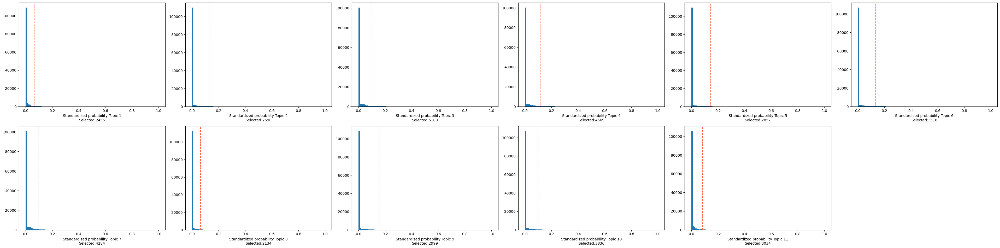

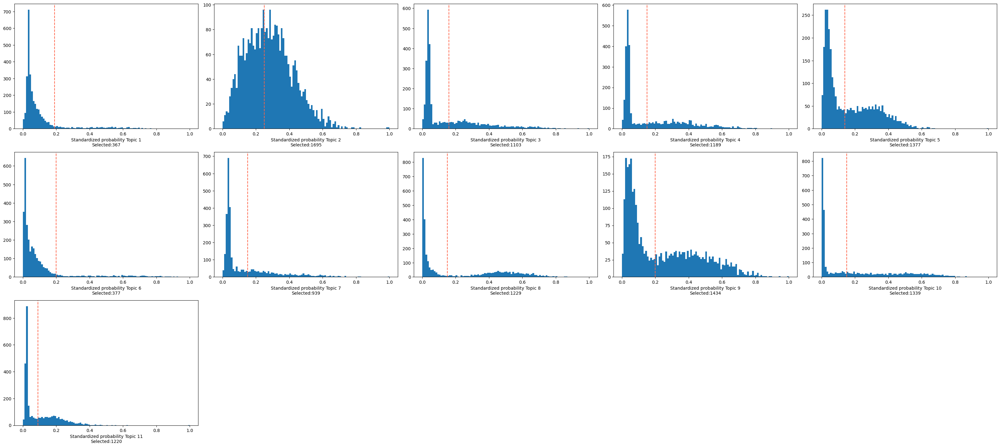

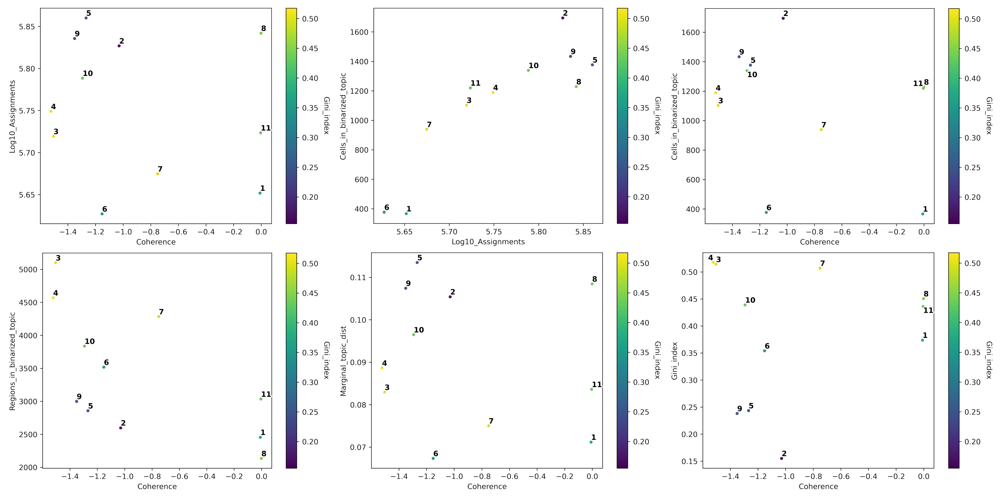

2023-02-02 14:32:50,157 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:32:50,698 cisTopic     INFO     Scaling
2023-02-02 14:32:51,438 cisTopic     INFO     Keep non zero rows
2023-02-02 14:32:52,278 cisTopic     INFO     Imputed accessibility sparsity: 0.2778550240229142
2023-02-02 14:32:52,280 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:32:52,281 cisTopic     INFO     Done!
2023-02-02 14:32:52,288 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:32:55,295 cisTopic     INFO     Done!
2023-02-02 14:32:57,870 cisTopic     INFO     Calculating mean
2023-02-02 14:32:58,227 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

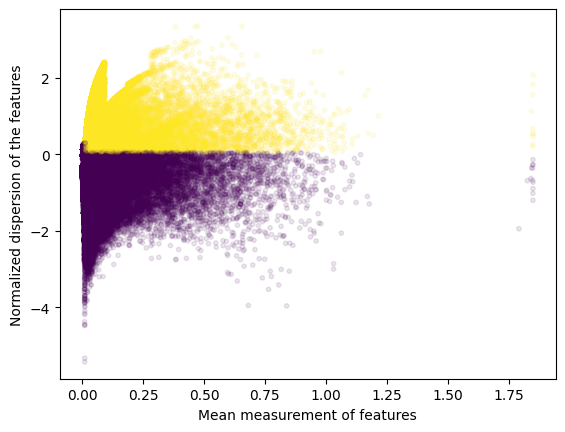

2023-02-02 14:33:04,747 cisTopic     INFO     Done!
Found 50890 variable regions


2023-02-02 14:33:08,906	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1114878) 2023-02-02 14:33:12,131 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1114879) 2023-02-02 14:33:12,385 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1114888) 2023-02-02 14:33:12,589 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1114895) 2023-02-02 14:33:12,924 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1114898) 2023-02-02 14:33:13,087 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1114882) 2023-02-02 14:33:13,369 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1114891) 2023-02-02 14:33:13,568 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1114878) 2023-02-02 14:33:14,078 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1114879) 2023-02-02 14:33:14,320 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1114888) 2023-02-02 14:33:14

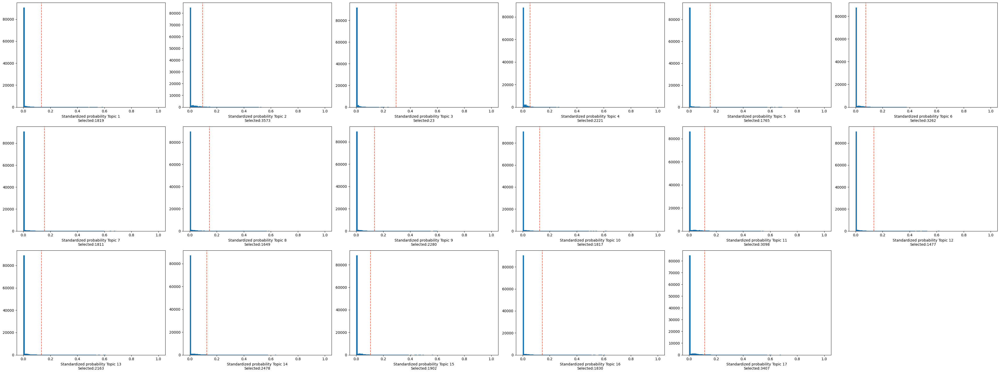

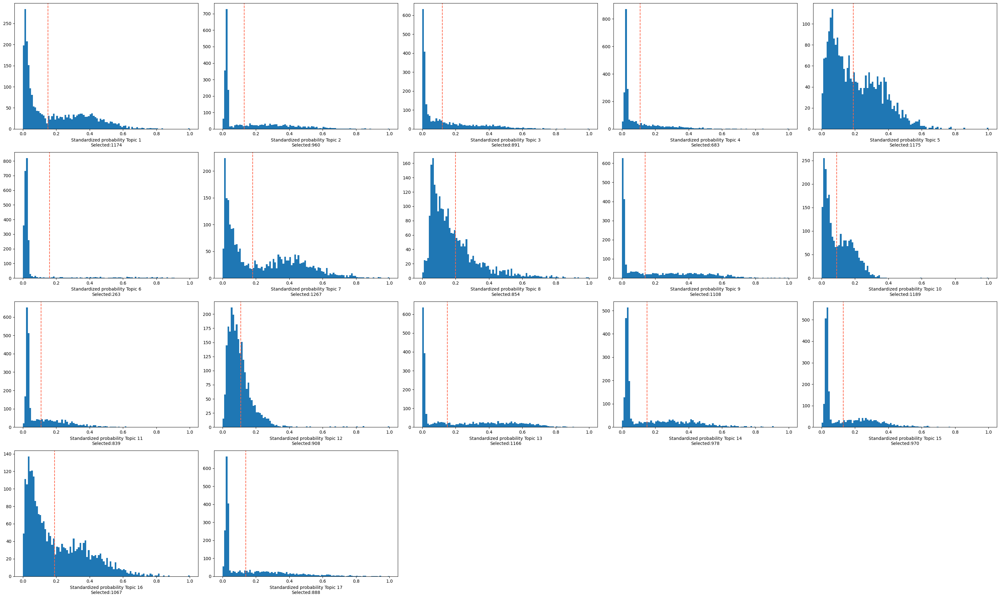

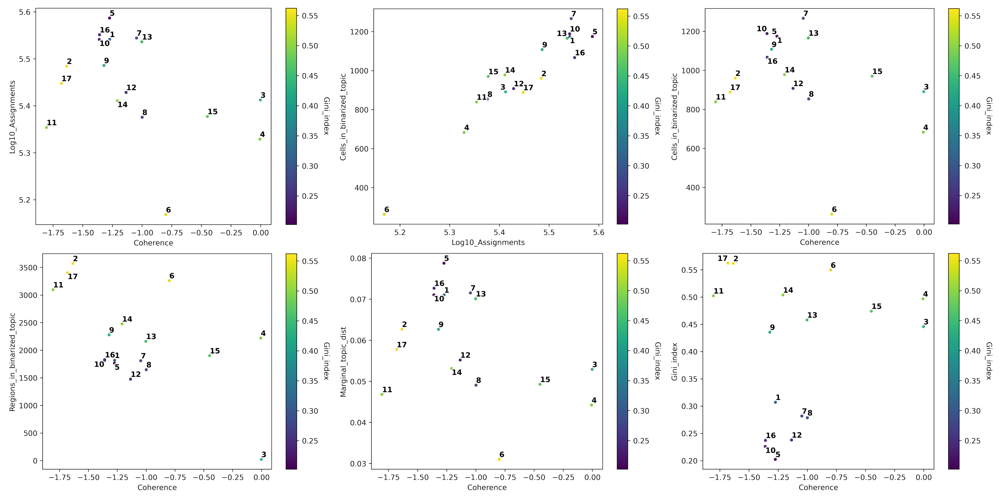

2023-02-02 14:34:29,949 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:34:30,355 cisTopic     INFO     Scaling
2023-02-02 14:34:30,850 cisTopic     INFO     Keep non zero rows
2023-02-02 14:34:31,434 cisTopic     INFO     Imputed accessibility sparsity: 0.24669227968484775
2023-02-02 14:34:31,435 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:34:31,436 cisTopic     INFO     Done!
2023-02-02 14:34:31,440 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:34:33,521 cisTopic     INFO     Done!
2023-02-02 14:34:35,328 cisTopic     INFO     Calculating mean
2023-02-02 14:34:35,575 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

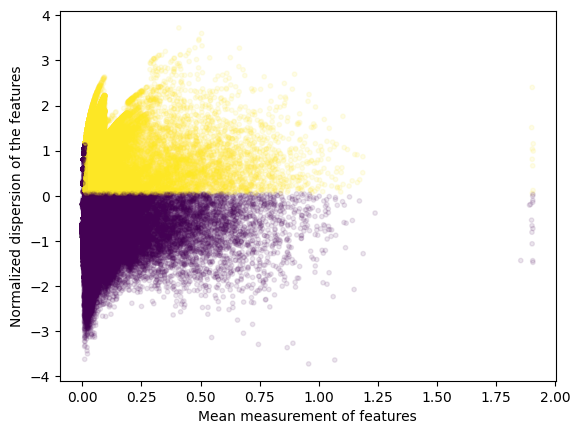

2023-02-02 14:34:40,885 cisTopic     INFO     Done!
Found 44877 variable regions


2023-02-02 14:34:45,117	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1115833) 2023-02-02 14:34:48,199 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1115835) 2023-02-02 14:34:48,348 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1115824) 2023-02-02 14:34:48,546 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1115832) 2023-02-02 14:34:48,729 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1115834) 2023-02-02 14:34:48,899 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1115821) 2023-02-02 14:34:49,039 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1115822) 2023-02-02 14:34:49,212 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1115833) 2023-02-02 14:34:49,492 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1115835) 2023-02-02 14:34:49,684 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1115824) 2023-02-02 14:34:49

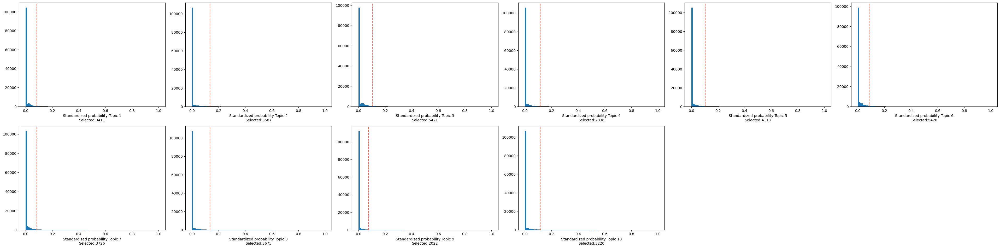

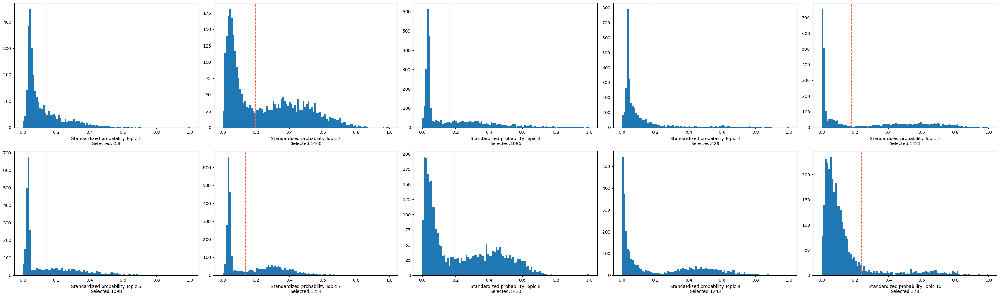

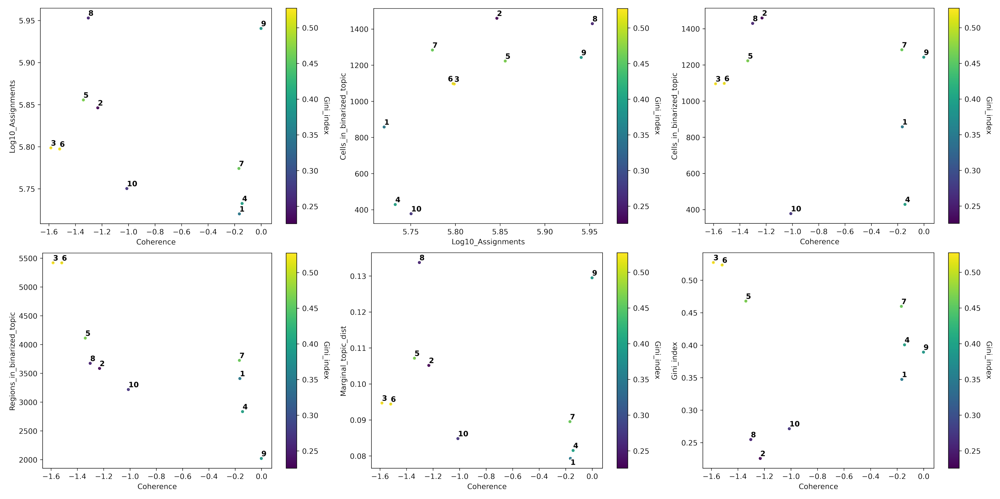

2023-02-02 14:35:51,584 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:35:52,151 cisTopic     INFO     Scaling
2023-02-02 14:35:52,883 cisTopic     INFO     Keep non zero rows
2023-02-02 14:35:53,716 cisTopic     INFO     Imputed accessibility sparsity: 0.2769444349989587
2023-02-02 14:35:53,717 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:35:53,718 cisTopic     INFO     Done!
2023-02-02 14:35:53,721 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:35:56,704 cisTopic     INFO     Done!
2023-02-02 14:35:59,318 cisTopic     INFO     Calculating mean
2023-02-02 14:35:59,673 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

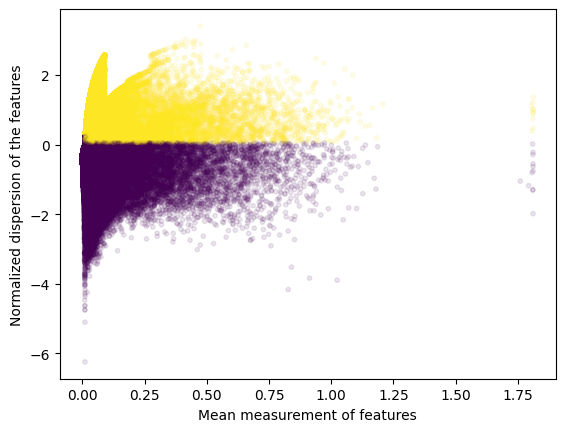

2023-02-02 14:36:06,450 cisTopic     INFO     Done!
Found 49148 variable regions


2023-02-02 14:36:10,553	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1116732) 2023-02-02 14:36:13,676 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1116728) 2023-02-02 14:36:13,991 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1116731) 2023-02-02 14:36:14,154 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1116725) 2023-02-02 14:36:14,445 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1116727) 2023-02-02 14:36:14,594 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1116736) 2023-02-02 14:36:14,870 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1116729) 2023-02-02 14:36:15,039 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1116732) 2023-02-02 14:36:15,479 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1116728) 2023-02-02 14:36:15,809 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1116731) 2023-02-02 14:36:15

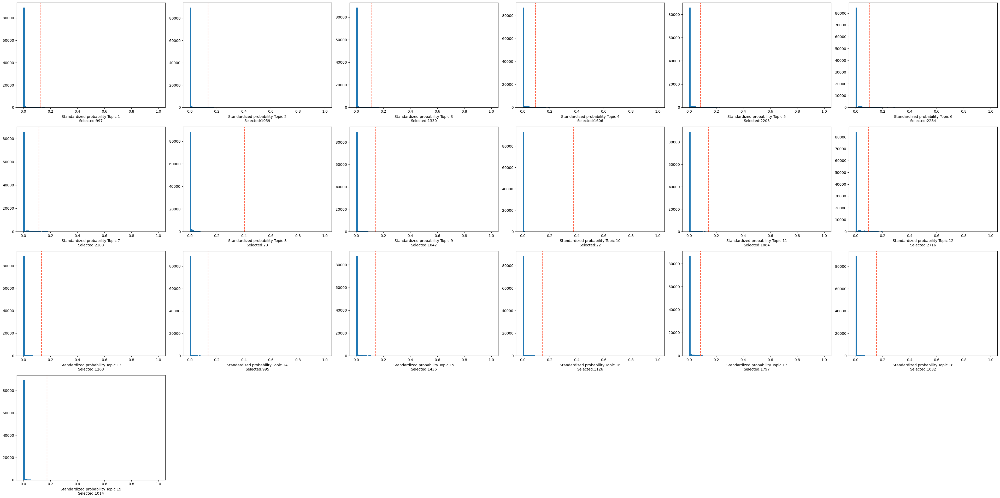

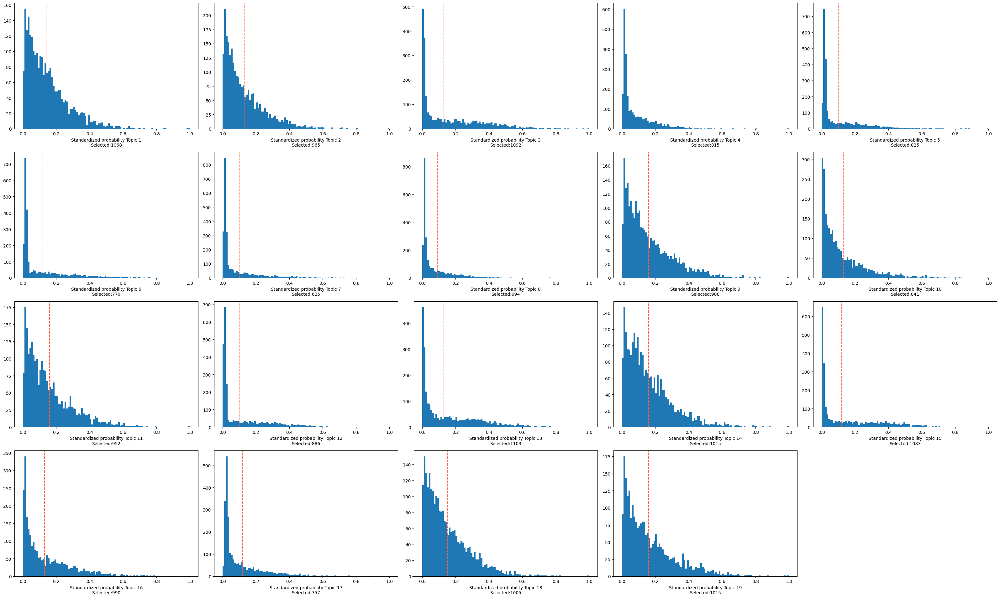

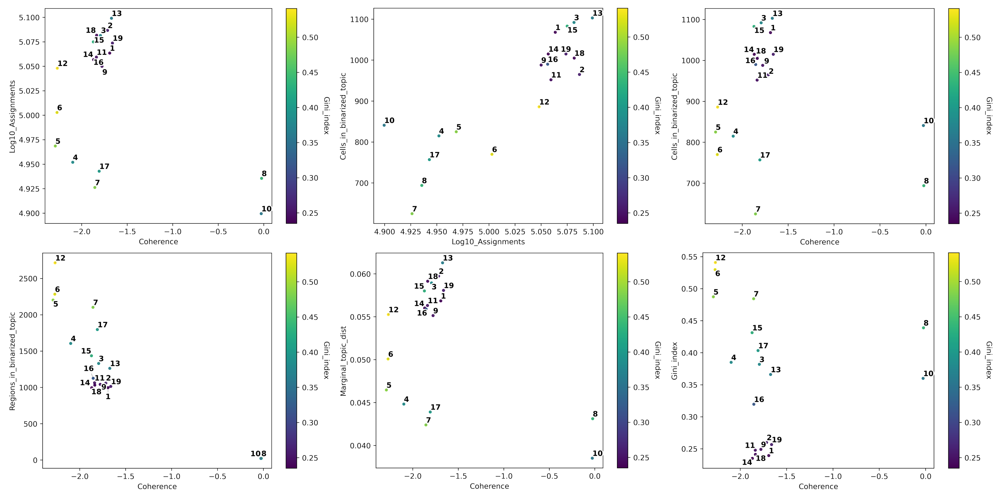

2023-02-02 14:37:35,918 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:37:36,332 cisTopic     INFO     Scaling
2023-02-02 14:37:36,809 cisTopic     INFO     Keep non zero rows
2023-02-02 14:37:37,362 cisTopic     INFO     Imputed accessibility sparsity: 0.22505831362997009
2023-02-02 14:37:37,363 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:37:37,364 cisTopic     INFO     Done!
2023-02-02 14:37:37,368 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:37:39,352 cisTopic     INFO     Done!
2023-02-02 14:37:41,089 cisTopic     INFO     Calculating mean
2023-02-02 14:37:41,330 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

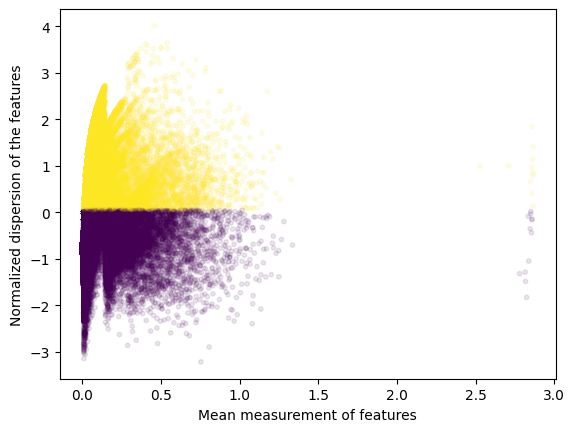

2023-02-02 14:37:46,631 cisTopic     INFO     Done!
Found 43278 variable regions


2023-02-02 14:38:06,387	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1117656) 2023-02-02 14:38:09,593 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1117649) 2023-02-02 14:38:09,646 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1117658) 2023-02-02 14:38:09,927 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1117665) 2023-02-02 14:38:10,063 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1117662) 2023-02-02 14:38:10,214 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1117647) 2023-02-02 14:38:10,505 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1117657) 2023-02-02 14:38:10,645 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1117656) 2023-02-02 14:38:10,845 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1117649) 2023-02-02 14:38:10,911 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1117665) 2023-02-02 14:38:11

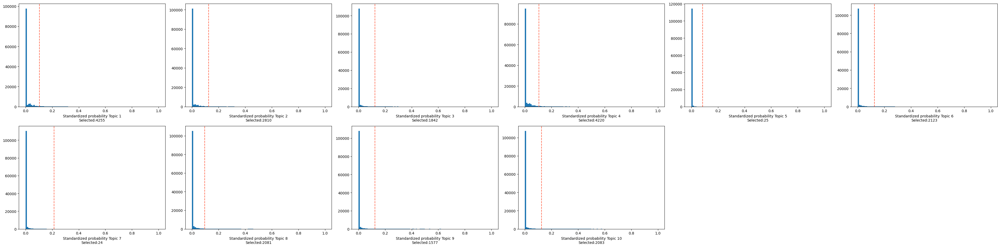

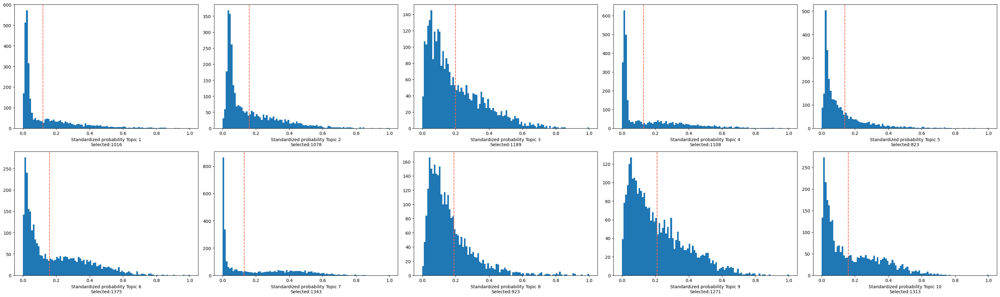

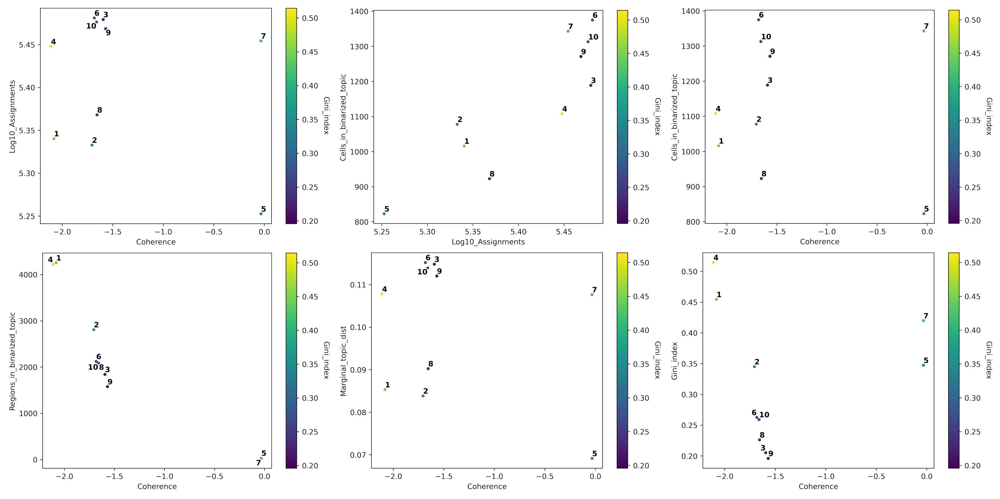

2023-02-02 14:39:13,104 cisTopic     INFO     Imputing drop-outs
2023-02-02 14:39:13,704 cisTopic     INFO     Scaling
2023-02-02 14:39:14,418 cisTopic     INFO     Keep non zero rows
2023-02-02 14:39:15,244 cisTopic     INFO     Imputed accessibility sparsity: 0.2576453013163661
2023-02-02 14:39:15,245 cisTopic     INFO     Create CistopicImputedFeatures object
2023-02-02 14:39:15,246 cisTopic     INFO     Done!
2023-02-02 14:39:15,249 cisTopic     INFO     Normalizing imputed data
2023-02-02 14:39:18,221 cisTopic     INFO     Done!
2023-02-02 14:39:20,788 cisTopic     INFO     Calculating mean
2023-02-02 14:39:21,139 cisTopic     INFO     Calculating variance


<Figure size 640x480 with 0 Axes>

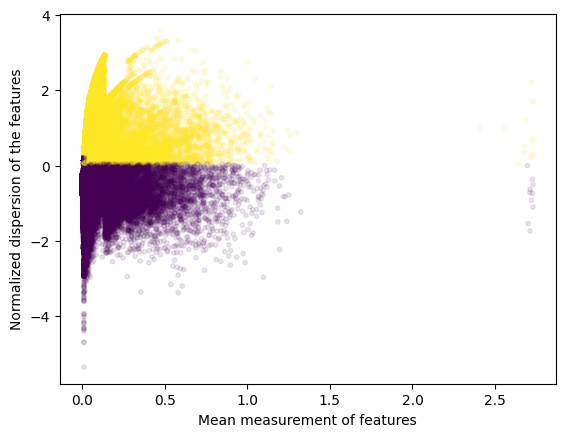

2023-02-02 14:39:27,659 cisTopic     INFO     Done!
Found 46295 variable regions


2023-02-02 14:39:32,759	INFO worker.py:1509 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 


(markers_ray pid=1118607) 2023-02-02 14:39:35,829 cisTopic     INFO     Formatting data for B cell
(markers_ray pid=1118605) 2023-02-02 14:39:36,098 cisTopic     INFO     Formatting data for CD14+ monocyte
(markers_ray pid=1118609) 2023-02-02 14:39:36,266 cisTopic     INFO     Formatting data for CD16+ monocyte
(markers_ray pid=1118596) 2023-02-02 14:39:36,498 cisTopic     INFO     Formatting data for CD4+ T cell
(markers_ray pid=1118603) 2023-02-02 14:39:36,613 cisTopic     INFO     Formatting data for Cytotoxic T cell
(markers_ray pid=1118602) 2023-02-02 14:39:36,893 cisTopic     INFO     Formatting data for Dendritic cell
(markers_ray pid=1118604) 2023-02-02 14:39:37,135 cisTopic     INFO     Formatting data for Natural killer cell
(markers_ray pid=1118607) 2023-02-02 14:39:37,584 cisTopic     INFO     Computing p-value for B cell
(markers_ray pid=1118605) 2023-02-02 14:39:37,874 cisTopic     INFO     Computing p-value for CD14+ monocyte
(markers_ray pid=1118609) 2023-02-02 14:39:38

<IPython.core.display.Javascript object>

In [19]:
for sample in cistopic_obj_path_dict.keys():
    # for sample  in ['SAN_10xmultiome_1.FIXEDCELLS']:
    path = cistopic_obj_path_dict[sample]
    if not os.path.exists(f"downstream_analysis/DARs/{sample}"):
        if os.path.isfile(path):
            print(f"Loading {path}")
            with open(path, "rb") as f:
                cto = pickle.load(f)

            df = pd.read_csv(
                seurat_path_dict[sample],
                sep="\t",
                index_col=0,
            )

            if "VIB_hydrop" in sample:
                df.index = [
                    x.replace("-2-VIB_hydrop_1", "-2___VIB_hydrop_1")
                    .replace("-1-VIB_hydrop_1", "-1___VIB_hydrop_1")
                    .replace("-2-VIB_hydrop_2", "-2___VIB_hydrop_2")
                    .replace("-1-VIB_hydrop_2", "-1___VIB_hydrop_2")
                    for x in df.index
                ]
            else:
                df.index = [x.replace("-", "___") for x in df.index]

            cto.cell_data["seurat_cell_type"] = df["cell_type"]

            cto.cell_names = cto.cell_data.index
            if [x.split("-")[0] for x in cto.selected_model.cell_topic.columns] == [
                x.split("___")[0] for x in list(cto.cell_names)
            ]:
                cto.selected_model.cell_topic.columns = list(cto.cell_names)

            region_bin_topics = binarize_topics(
                cto,
                method="otsu",
                ntop=3000,
                plot=True,
                num_columns=6,
                save=f"plots_qc/{sample}__topic_region_binarized.png",
            )

            with open(
                f"downstream_analysis/binarized_topics/{sample}__topic_region_binarized.pkl",
                "wb",
            ) as f:
                pickle.dump(region_bin_topics, f, protocol=4)

            binarized_cell_topics = binarize_topics(
                cto,
                target="cell",
                method="li",
                plot=True,
                num_columns=5,
                nbins=100,
                save=f"plots_qc/{sample}__cells_topic_binarized.png",
            )

            with open(
                f"downstream_analysis/binarized_topics/{sample}__cells_topic_binarized.pkl",
                "wb",
            ) as f:
                pickle.dump(region_bin_topics, f, protocol=4)

            topic_qc_metrics = compute_topic_metrics(cto)

            with open(
                f"downstream_analysis/binarized_topics/{sample}__topic_qc.pkl", "wb"
            ) as f:
                pickle.dump(topic_qc_metrics, f, protocol=4)

            fig_dict = {
                "CoherenceVSAssignments": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Coherence",
                    var_y="Log10_Assignments",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
                "AssignmentsVSCells_in_bin": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Log10_Assignments",
                    var_y="Cells_in_binarized_topic",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
                "CoherenceVSCells_in_bin": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Coherence",
                    var_y="Cells_in_binarized_topic",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
                "CoherenceVSRegions_in_bin": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Coherence",
                    var_y="Regions_in_binarized_topic",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
                "CoherenceVSMarginal_dist": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Coherence",
                    var_y="Marginal_topic_dist",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
                "CoherenceVSGini_index": plot_topic_qc(
                    topic_qc_metrics,
                    var_x="Coherence",
                    var_y="Gini_index",
                    var_color="Gini_index",
                    plot=False,
                    return_fig=True,
                ),
            }

            fig = plt.figure(figsize=(40, 43))
            i = 1
            for fig_ in fig_dict.keys():
                plt.subplot(2, 3, i)
                img = fig2img(
                    fig_dict[fig_]
                )  # To convert figures to png to plot together, see .utils.py. This converts the figure to png.
                plt.imshow(img)
                plt.axis("off")
                i += 1
            plt.subplots_adjust(wspace=0, hspace=-0.70)
            # plt.tight_layout()
            plt.show()
            plt.savefig(
                f"plots_qc/{sample}__topic_qc_metrics.png", facecolor="white", dpi=150
            )

            topic_annot = topic_annotation(
                cto,
                annot_var="seurat_cell_type",
                binarized_cell_topic=binarized_cell_topics,
                general_topic_thr=0.2,
            )
            topic_qc_metrics = pd.concat(
                [
                    topic_annot[
                        [
                            "seurat_cell_type",
                            "Ratio_cells_in_topic",
                            "Ratio_group_in_population",
                        ]
                    ],
                    topic_qc_metrics,
                ],
                axis=1,
            )

            imputed_acc_obj = impute_accessibility(
                cto, selected_cells=None, selected_regions=None, scale_factor=10**6
            )

            normalized_imputed_acc_obj = normalize_scores(
                imputed_acc_obj, scale_factor=10**4
            )

            with open(
                f"downstream_analysis/imputed_acc_objs/{sample}__imputed_acc_obs.pkl",
                "wb",
            ) as f:
                pickle.dump(normalized_imputed_acc_obj, f, protocol=4)

            variable_regions = find_highly_variable_features(
                normalized_imputed_acc_obj,
                min_disp=0.05,
                min_mean=0.0125,
                max_mean=3,
                max_disp=np.inf,
                n_bins=20,
                n_top_features=None,
                plot=True,
                save=f"plots_qc/{sample}__HVR.png",
            )

            print(f"Found {len(variable_regions)} variable regions")
            with open(f"downstream_analysis/HVRs/{sample}__HVRs.bed", "w") as f:
                for line in [
                    x.replace(":", "\t").replace("-", "\t") for x in variable_regions
                ]:
                    f.write(f"{line}\n")

            with open(f"downstream_analysis/HVRs/{sample}__HVRs.pkl", "wb") as f:
                pickle.dump(variable_regions, f, protocol=4)

            os.mkdir(f"downstream_analysis/DARs/{sample}")

            markers_dict = find_diff_features(
                cto,
                normalized_imputed_acc_obj,
                variable="seurat_cell_type",
                var_features=variable_regions,
                contrasts=None,
                adjpval_thr=0.05,
                log2fc_thr=np.log2(1.5),
                n_cpu=16,
            )
            with open(
                f"downstream_analysis/DARs/{sample}/{sample}__DARs_dict.pkl", "wb"
            ) as f:
                pickle.dump(markers_dict, f, protocol=4)

            for cell_type in markers_dict.keys():
                markers = markers_dict[cell_type].index.tolist()
                df = pd.DataFrame(markers)
                if len(df) == 0:
                    print(f"no DARs found for {cell_type} in {sample}")
                else:
                    df[[0, 1]] = df[0].str.split(":", expand=True)
                    df[[1, 2]] = df[1].str.split("-", expand=True)
                    df[3] = markers_dict[cell_type].index.tolist()
                    df[3] = cell_type.replace(" ", "_")  # + '_' + df[3].astype(str)
                    score = markers_dict[cell_type]["Log2FC"]
                    score = score.reset_index(drop=True)
                    df[4] = score
                    df[5] = "."
                    pval = markers_dict[cell_type]["Adjusted_pval"]
                    pval = pval.reset_index(drop=True)
                    df[6] = pval
                    name = cell_type.replace(" ", "_")
                    # name = name.replace('/', '-')
                    if not os.path.exists(f"downstream_analysis/DARs/{sample}"):
                        os.mkdir(f"downstream_analysis/DARs/{sample}")

                    df.to_csv(
                        f'downstream_analysis/DARs/{sample}/{sample}__{cell_type.replace(" ", "_")}__DARs.bed',
                        sep="\t",
                        header=False,
                        index=False,
                    )
                    df[0:2000].to_csv(
                        f'downstream_analysis/DARs/{sample}/{sample}__{cell_type.replace(" ", "_")}__DARs.TOP2k.bed',
                        sep="\t",
                        header=False,
                        index=False,
                    )

        else:
            print(f"{path} does not exist!")
    else:
        print(f"downstream_analysis/DARs/{sample} already exists!")